In [1]:
import sys
sys.path.append('../..')

%load_ext autoreload
%autoreload 2
%matplotlib inline


In [2]:
import numpy as np

import matplotlib.image as mpimg
import matplotlib.pyplot as plt

from skimage.io import imread
import cv2

from gen.load_data import load_data
from gen.datagen import oversample_generator_from_df


/home/faisal/anaconda3/envs/ai/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [3]:
from sklearn.utils import shuffle

train_df, valid_df, test_df = load_data('../../data')


In [4]:
train_df.head()

,image,id,label
0,../../data/Train/CameraRGB/episode_0002_000287...,episode_0002_000287,../../data/Train/CameraSeg/episode_0002_000287...
1,../../data/Train/CameraRGB/episode_0008_000112...,episode_0008_000112,../../data/Train/CameraSeg/episode_0008_000112...
2,../../data/Train/CameraRGB/804.png,804,../../data/Train/CameraSeg/804.png
3,../../data/Train/CameraRGB/episode_0008_000286...,episode_0008_000286,../../data/Train/CameraSeg/episode_0008_000286...
4,../../data/Train/CameraRGB/episode_0003_000261...,episode_0003_000261,../../data/Train/CameraSeg/episode_0003_000261...


In [5]:
valid_df.head()

,image,id,label
0,../../data/Valid/CameraRGB/00019.png,00019,../../data/Valid/CameraSeg/00019.png
1,../../data/Valid/CameraRGB/00413.png,00413,../../data/Valid/CameraSeg/00413.png
2,../../data/Valid/CameraRGB/00035.png,00035,../../data/Valid/CameraSeg/00035.png
3,../../data/Valid/CameraRGB/00264.png,00264,../../data/Valid/CameraSeg/00264.png
4,../../data/Valid/CameraRGB/00172.png,00172,../../data/Valid/CameraSeg/00172.png


In [6]:
test_df.head()

,image,id,label
0,../../data/Test/CameraRGB/00019.png,00019,../../data/Test/CameraSeg/00019.png
1,../../data/Test/CameraRGB/00413.png,00413,../../data/Test/CameraSeg/00413.png
2,../../data/Test/CameraRGB/00035.png,00035,../../data/Test/CameraSeg/00035.png
3,../../data/Test/CameraRGB/00264.png,00264,../../data/Test/CameraSeg/00264.png
4,../../data/Test/CameraRGB/00172.png,00172,../../data/Test/CameraSeg/00172.png


In [175]:
    def random_transform(X, Y, tran=8, rot=8, shear=3):
        rows,cols,_ = X.shape    

        tx = tran * np.random.uniform() - tran/2
        ty = tran * np.random.uniform() - tran/2

        transMat = np.float32([[1, 0, tx], [0, 1, ty]])
        X = cv2.warpAffine(X, transMat, (cols,rows))
        Y = cv2.warpAffine(Y, transMat, (cols,rows))

        ang_rot = np.random.uniform(rot)-rot/2
        rot_M = cv2.getRotationMatrix2D((cols/2,rows/2), ang_rot, 1)
        X = cv2.warpAffine(X, rot_M,( cols,rows) )
        Y = cv2.warpAffine(Y, rot_M,( cols,rows) )

        pt1 = 5+shear*np.random.uniform()-shear/2
        pt2 = 20+shear*np.random.uniform()-shear/2
        pts1 = np.float32([[5,5],[20,5],[5,20]])
        pts2 = np.float32([[pt1,5],[pt2,pt1],[5,pt2]])
        shear_M = cv2.getAffineTransform(pts1,pts2)
        X = cv2.warpAffine(X, shear_M, (cols,rows))
        Y = cv2.warpAffine(Y, shear_M, (cols,rows))


        return X.astype(np.uint8), Y.astype(np.uint8)


In [170]:
from skimage.io import imread
from gen.datagen import preprocess_label

def _cluster_train_set(df):
    weights = []
    ind = []
    for i, row in train_df.iterrows():
        lbl = preprocess_label(imread(row['label']))
        weights.append( 1 + lbl[:, :, 0].nonzero()[0].shape[0])
        ind.append(i)
    
    weights = np.array(weights)
    weights = [float(i)/sum(weights) for i in weights]
    c = sorted(zip(weights, ind))
    
    minor_cls_ind = [i[1] for i in reversed(ans[-1000:]) ]
    major_cls_ind = [i[1] for i in ans[0:1500]]
    
    return minor_cls_ind, major_cls_ind

In [173]:
minor_cls_ind, major_cls_ind = _cluster_train_set(train_df)

In [224]:
for image, label in zip(train_df.loc[minor_cls_ind[0:10]].image, train_df.loc[minor_cls_ind[0:10]].label):
    print(image, label)


../../data/Train/CameraRGB/episode_0011_000145.png ../../data/Train/CameraSeg/episode_0011_000145.png
../../data/Train/CameraRGB/episode_0010_000299.png ../../data/Train/CameraSeg/episode_0010_000299.png
../../data/Train/CameraRGB/episode_0011_000146.png ../../data/Train/CameraSeg/episode_0011_000146.png
../../data/Train/CameraRGB/episode_0011_000147.png ../../data/Train/CameraSeg/episode_0011_000147.png
../../data/Train/CameraRGB/episode_0010_000298.png ../../data/Train/CameraSeg/episode_0010_000298.png
../../data/Train/CameraRGB/episode_0010_000148.png ../../data/Train/CameraSeg/episode_0010_000148.png
../../data/Train/CameraRGB/episode_0010_000297.png ../../data/Train/CameraSeg/episode_0010_000297.png
../../data/Train/CameraRGB/episode_0010_000147.png ../../data/Train/CameraSeg/episode_0010_000147.png
../../data/Train/CameraRGB/episode_0011_000144.png ../../data/Train/CameraSeg/episode_0011_000144.png
../../data/Train/CameraRGB/episode_0006_000177.png ../../data/Train/CameraSeg/epis

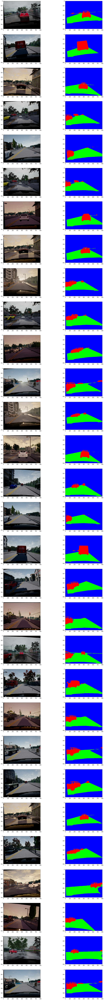

In [202]:
X = []
Y = []
for c, i in enumerate(np.random.choice(minor_cls_ind, 30)):
    x, y = random_transform(imread(train_df.iloc[i].image), preprocess_label(imread(train_df.iloc[i].label)))
    y[:, :, 2] = np.invert(np.logical_or(y[:, :, 0], y[:, :, 1])).astype(np.uint8)
    X.append(x)
    Y.append(y)

sample_rows = 30

fig, m_axs = plt.subplots(sample_rows, 2, figsize = (20, 6*sample_rows))
for (ax1, ax2), x, y in zip(m_axs, X, Y):
    ax1.imshow(x)
    ax2.imshow(y*255)

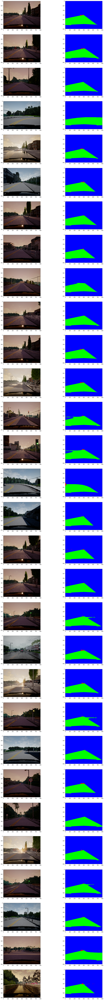

In [177]:
X = []
Y = []

for c, i in enumerate(np.random.choice(major_cls_ind, 30)):
    x, y = imread(train_df.iloc[i].image), preprocess_label(imread(train_df.iloc[i].label))
    X.append(x)
    Y.append(y)

sample_rows = 30

fig, m_axs = plt.subplots(sample_rows, 2, figsize = (20, 6*sample_rows))
for (ax1, ax2), x, y in zip(m_axs, X, Y):
    ax1.imshow(x)
    ax2.imshow(y*255)

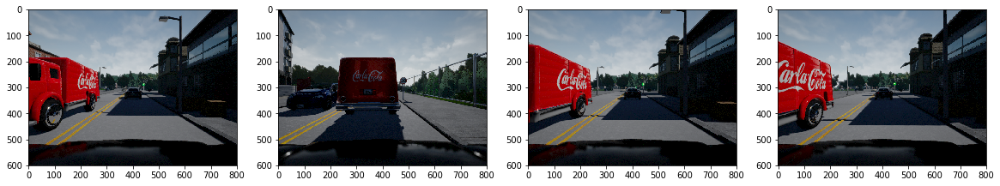

In [41]:
plt.figure(figsize=(20, 10))
plt.subplot(141)
plt.imshow(imread(train_df.iloc[major_indices[0]].image))
plt.subplot(142)
plt.imshow(imread(train_df.iloc[major_indices[1]].image))
plt.subplot(143)
plt.imshow(imread(train_df.iloc[major_indices[2]].image))
plt.subplot(144)
plt.imshow(imread(train_df.iloc[major_indices[3]].image))

In [ ]:
def gen_oversample_minority_class(df, batch_size, target_size, weights):
  nbatches, n_skipped_per_epoch = divmod(df.shape[0], batch_size)

  count =1
  epoch = 0


  while 1:
    epoch += 1
    i, j = 0, batch_size
    # Mini-batches within epoch.
    mini_batches_completed = 0
    for _ in range(nbatches):
      # seed = np.random.choice(range(1000))
      sub = df.sample(n=batch_size, replace=False, weights=weights)

      X = np.array([cv2.resize(preprocess_input(img_to_array(imread(f))), (target_size[1], target_size[0])) for f in sub.image])
      Y = np.array([cv2.resize(preprocess_label(img_to_array(imread(f))), (target_size[1], target_size[0])) for f in sub.label])

      yield X, Y
      i = j
      j += batch_size
      count += 1

In [ ]:
def plot_next_batch():
    X, Y = next(gen)

    sample_rows = 12
    fig, m_axs = plt.subplots(sample_rows, 2, figsize = (20, 6*sample_rows))
    for (ax1, ax2), rgb_img, lab_img in zip(m_axs, X, Y):
        img = np.clip(rgb_img+110, 0, 255).astype(np.uint8)
        lab_img = np.clip(lab_img*255, 0, 255).astype(np.uint8)
        ax1.imshow(img)
        ax1.set_title('Color')
        ax2.imshow(lab_img[:, :, 0:3])
        ax2.set_title('Labels')
plot_next_batch()

In [ ]:
plot_next_batch()

In [ ]:
plot_next_batch()

In [ ]:
plot_next_batch()

In [ ]:

from gen.generators import preprocess_label

bg, road, cars = 0, 0, 0
for i, row in train_df.sample(2500).iterrows():
    l = preprocess_label(imread(row['label']))
    
    cars += l[:, :, 0].nonzero()[1].shape[0]
    road += l[:, :, 1].nonzero()[1].shape[0]
    bg   += l[:, :, 2].nonzero()[1].shape[0]

print (bg, road, cars)

t = bg + road + cars
car_p = cars/t
road_p = road/t
bg_p = bg/t

In [ ]:
print ("Car {}%, Road {}%, BG {}%".format(car_p, road_p, bg_p))

In [ ]:
t = cars+bg+road
p_car = t/cars
p_road = t/road
p_bg = t/bg

print(p_car, p_road, p_bg)

In [ ]:
(rgb_batch, lab_batch) = next(train_and_lab_gen)

sample_rows = 12
fig, m_axs = plt.subplots(sample_rows, 2, figsize = (20, 6*sample_rows))
# [c_ax.axis('off') for c_ax in m_axs.flatten()]
for (ax1, ax2), rgb_img, lab_img in zip(m_axs, rgb_batch, lab_batch):
    # undoing the vgg correction is tedious
    r_rgb_img = np.clip(rgb_img+110, 0, 255).astype(np.uint8)
    ax1.imshow(cv2.cvtColor(r_rgb_img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Color')
    ax2.imshow(lab_img)
    ax2.set_title('Labels')

In [186]:
def gen_test():
    print ("Generating")
    while 1:
        i = 0
        for _ in range(10):
            x = i
            yield x
            i += 1


In [190]:
g = gen_test()

In [201]:
next(g)

0